### Human vs Horse detector - Transfer Learning

In this project a model will be trained which will differentiate an image between whether it is a horse or a person. There are 1000 images for training and 256 for validation with different sizes and positions.

In addition, a method called **Transfer learning** will be applied, which will allow us to use a previously trained and deeper model with the aim of optimizing work time.

Here we explicitly do not have a label for each image, so we will use the [ImageDataGenerator](https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image/ImageDataGenerator) API instead. and it will automatically do the label for us.

In [1]:
# Import all the necessary files!
import os
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras import Model

In [2]:
# Download the inception v3 weights

# Import the inception model  
from tensorflow.keras.applications.inception_v3 import InceptionV3

# Create an instance of the inception model from the local pre-trained weights
local_weights_file = 'inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5'

pre_trained_model = InceptionV3(input_shape = (150, 150, 3), 
                                include_top = False, 
                                weights = None)

pre_trained_model.load_weights(local_weights_file)

# Make all the layers in the pre-trained model non-trainable
for layer in pre_trained_model.layers:
  layer.trainable = False
  
# Print the model summary
pre_trained_model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 150, 150, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 74, 74, 32)   864         ['input_1[0][0]']                
                                                                                                  
 batch_normalization (BatchNorm  (None, 74, 74, 32)  96          ['conv2d[0][0]']                 
 alization)                                                                                       
                                                                                       

 batch_normalization_10 (BatchN  (None, 16, 16, 96)  288         ['conv2d_10[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 batch_normalization_11 (BatchN  (None, 16, 16, 32)  96          ['conv2d_11[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_5 (Activation)      (None, 16, 16, 64)   0           ['batch_normalization_5[0][0]']  
                                                                                                  
 activation_7 (Activation)      (None, 16, 16, 64)   0           ['batch_normalization_7[0][0]']  
                                                                                                  
 activatio

 conv2d_20 (Conv2D)             (None, 16, 16, 48)   13824       ['mixed1[0][0]']                 
                                                                                                  
 conv2d_23 (Conv2D)             (None, 16, 16, 96)   55296       ['activation_22[0][0]']          
                                                                                                  
 batch_normalization_20 (BatchN  (None, 16, 16, 48)  144         ['conv2d_20[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 batch_normalization_23 (BatchN  (None, 16, 16, 96)  288         ['conv2d_23[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activatio

                                                                                                  
 conv2d_34 (Conv2D)             (None, 7, 7, 128)    98304       ['mixed3[0][0]']                 
                                                                                                  
 batch_normalization_34 (BatchN  (None, 7, 7, 128)   384         ['conv2d_34[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_34 (Activation)     (None, 7, 7, 128)    0           ['batch_normalization_34[0][0]'] 
                                                                                                  
 conv2d_35 (Conv2D)             (None, 7, 7, 128)    114688      ['activation_34[0][0]']          
                                                                                                  
 batch_nor

                                                                                                  
 activation_44 (Activation)     (None, 7, 7, 160)    0           ['batch_normalization_44[0][0]'] 
                                                                                                  
 conv2d_45 (Conv2D)             (None, 7, 7, 160)    179200      ['activation_44[0][0]']          
                                                                                                  
 batch_normalization_45 (BatchN  (None, 7, 7, 160)   480         ['conv2d_45[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_45 (Activation)     (None, 7, 7, 160)    0           ['batch_normalization_45[0][0]'] 
                                                                                                  
 conv2d_41

 batch_normalization_55 (BatchN  (None, 7, 7, 160)   480         ['conv2d_55[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_55 (Activation)     (None, 7, 7, 160)    0           ['batch_normalization_55[0][0]'] 
                                                                                                  
 conv2d_51 (Conv2D)             (None, 7, 7, 160)    122880      ['mixed5[0][0]']                 
                                                                                                  
 conv2d_56 (Conv2D)             (None, 7, 7, 160)    179200      ['activation_55[0][0]']          
                                                                                                  
 batch_normalization_51 (BatchN  (None, 7, 7, 160)   480         ['conv2d_51[0][0]']              
 ormalizat

 conv2d_61 (Conv2D)             (None, 7, 7, 192)    147456      ['mixed6[0][0]']                 
                                                                                                  
 conv2d_66 (Conv2D)             (None, 7, 7, 192)    258048      ['activation_65[0][0]']          
                                                                                                  
 batch_normalization_61 (BatchN  (None, 7, 7, 192)   576         ['conv2d_61[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 batch_normalization_66 (BatchN  (None, 7, 7, 192)   576         ['conv2d_66[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activatio

 ormalization)                                                                                    
                                                                                                  
 batch_normalization_74 (BatchN  (None, 7, 7, 192)   576         ['conv2d_74[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_70 (Activation)     (None, 7, 7, 192)    0           ['batch_normalization_70[0][0]'] 
                                                                                                  
 activation_74 (Activation)     (None, 7, 7, 192)    0           ['batch_normalization_74[0][0]'] 
                                                                                                  
 conv2d_71 (Conv2D)             (None, 3, 3, 320)    552960      ['activation_70[0][0]']          
          

                                                                                                  
 activation_82 (Activation)     (None, 3, 3, 384)    0           ['batch_normalization_82[0][0]'] 
                                                                                                  
 activation_83 (Activation)     (None, 3, 3, 384)    0           ['batch_normalization_83[0][0]'] 
                                                                                                  
 batch_normalization_84 (BatchN  (None, 3, 3, 192)   576         ['conv2d_84[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_76 (Activation)     (None, 3, 3, 320)    0           ['batch_normalization_76[0][0]'] 
                                                                                                  
 mixed9_0 

 ormalization)                                                                                    
                                                                                                  
 activation_85 (Activation)     (None, 3, 3, 320)    0           ['batch_normalization_85[0][0]'] 
                                                                                                  
 mixed9_1 (Concatenate)         (None, 3, 3, 768)    0           ['activation_87[0][0]',          
                                                                  'activation_88[0][0]']          
                                                                                                  
 concatenate_1 (Concatenate)    (None, 3, 3, 768)    0           ['activation_91[0][0]',          
                                                                  'activation_92[0][0]']          
                                                                                                  
 activatio

In [3]:
last_layer = pre_trained_model.get_layer('mixed7')
print('last layer output shape: ', last_layer.output_shape)
last_output = last_layer.output

last layer output shape:  (None, 7, 7, 768)


In [4]:

from tensorflow.keras.optimizers import RMSprop

# Flatten the output layer to 1 dimension
x = layers.Flatten()(last_output)
# Add a fully connected layer with 1,024 hidden units and ReLU activation
x = layers.Dense(1024, activation='relu')(x)
# Add a dropout rate of 0.2
x = layers.Dropout(0.2)(x)                  
# Add a final sigmoid layer for classification
x = layers.Dense  (1, activation='sigmoid')(x)           

model = Model( pre_trained_model.input, x) 

model.compile(optimizer = RMSprop(lr=0.0001), 
              loss = 'binary_crossentropy', 
              metrics = ['acc'])

model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 150, 150, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 74, 74, 32)   864         ['input_1[0][0]']                
                                                                                                  
 batch_normalization (BatchNorm  (None, 74, 74, 32)  96          ['conv2d[0][0]']                 
 alization)                                                                                       
                                                                                              

 batch_normalization_10 (BatchN  (None, 16, 16, 96)  288         ['conv2d_10[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 batch_normalization_11 (BatchN  (None, 16, 16, 32)  96          ['conv2d_11[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_5 (Activation)      (None, 16, 16, 64)   0           ['batch_normalization_5[0][0]']  
                                                                                                  
 activation_7 (Activation)      (None, 16, 16, 64)   0           ['batch_normalization_7[0][0]']  
                                                                                                  
 activatio

 conv2d_20 (Conv2D)             (None, 16, 16, 48)   13824       ['mixed1[0][0]']                 
                                                                                                  
 conv2d_23 (Conv2D)             (None, 16, 16, 96)   55296       ['activation_22[0][0]']          
                                                                                                  
 batch_normalization_20 (BatchN  (None, 16, 16, 48)  144         ['conv2d_20[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 batch_normalization_23 (BatchN  (None, 16, 16, 96)  288         ['conv2d_23[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activatio

                                                                                                  
 conv2d_34 (Conv2D)             (None, 7, 7, 128)    98304       ['mixed3[0][0]']                 
                                                                                                  
 batch_normalization_34 (BatchN  (None, 7, 7, 128)   384         ['conv2d_34[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_34 (Activation)     (None, 7, 7, 128)    0           ['batch_normalization_34[0][0]'] 
                                                                                                  
 conv2d_35 (Conv2D)             (None, 7, 7, 128)    114688      ['activation_34[0][0]']          
                                                                                                  
 batch_nor

/home/furg/anaconda3/lib/python3.8/site-packages/keras/optimizers/optimizer_v2/rmsprop.py:135: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(RMSprop, self).__init__(name, **kwargs)


 conv2d_32 (Conv2D)             (None, 7, 7, 128)    114688      ['activation_31[0][0]']          
                                                                                                  
 conv2d_37 (Conv2D)             (None, 7, 7, 128)    114688      ['activation_36[0][0]']          
                                                                                                  
 batch_normalization_32 (BatchN  (None, 7, 7, 128)   384         ['conv2d_32[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 batch_normalization_37 (BatchN  (None, 7, 7, 128)   384         ['conv2d_37[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activatio

 ormalization)                                                                                    
                                                                                                  
 batch_normalization_47 (BatchN  (None, 7, 7, 160)   480         ['conv2d_47[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_42 (Activation)     (None, 7, 7, 160)    0           ['batch_normalization_42[0][0]'] 
                                                                                                  
 activation_47 (Activation)     (None, 7, 7, 160)    0           ['batch_normalization_47[0][0]'] 
                                                                                                  
 average_pooling2d_4 (AveragePo  (None, 7, 7, 768)   0           ['mixed4[0][0]']                 
 oling2D) 

 activation_52 (Activation)     (None, 7, 7, 160)    0           ['batch_normalization_52[0][0]'] 
                                                                                                  
 activation_57 (Activation)     (None, 7, 7, 160)    0           ['batch_normalization_57[0][0]'] 
                                                                                                  
 average_pooling2d_5 (AveragePo  (None, 7, 7, 768)   0           ['mixed5[0][0]']                 
 oling2D)                                                                                         
                                                                                                  
 conv2d_50 (Conv2D)             (None, 7, 7, 192)    147456      ['mixed5[0][0]']                 
                                                                                                  
 conv2d_53 (Conv2D)             (None, 7, 7, 192)    215040      ['activation_52[0][0]']          
          

 oling2D)                                                                                         
                                                                                                  
 conv2d_60 (Conv2D)             (None, 7, 7, 192)    147456      ['mixed6[0][0]']                 
                                                                                                  
 conv2d_63 (Conv2D)             (None, 7, 7, 192)    258048      ['activation_62[0][0]']          
                                                                                                  
 conv2d_68 (Conv2D)             (None, 7, 7, 192)    258048      ['activation_67[0][0]']          
                                                                                                  
 conv2d_69 (Conv2D)             (None, 7, 7, 192)    147456      ['average_pooling2d_6[0][0]']    
                                                                                                  
 batch_nor

In [5]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os
import zipfile

In [6]:


# Unzip the dataset for Train and Validation
local_zip = './horse-or-human.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('./horse-or-human')


# Unzip validation set
local_zip = './validation-horse-or-human.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('./validation-horse-or-human')

zip_ref.close()

In [7]:
import os

# Directory the datasets
train_horse_dir = os.path.join('./horse-or-human/horses')

train_human_dir = os.path.join('./horse-or-human/humans')

validation_horse_dir = os.path.join('./validation-horse-or-human/horses')

validation_human_dir = os.path.join('./validation-horse-or-human/humans')

Below are some names of the images grouped in the different training and validation sets.

In [8]:
train_horse_names = os.listdir(train_horse_dir)
print(f'TRAIN SET HORSES: {train_horse_names[:5]}')

train_human_names = os.listdir(train_human_dir)
print(f'TRAIN SET HUMANS: {train_human_names[:5]}')

validation_horse_names = os.listdir(validation_horse_dir)
print(f'VAL SET HORSES: {validation_horse_names[:5]}')

validation_human_names = os.listdir(validation_human_dir)
print(f'VAL SET HUMANS: {validation_human_names[:5]}')

TRAIN SET HORSES: ['horse18-7.png', 'horse27-2.png', 'horse50-7.png', 'horse44-6.png', 'horse44-7.png']
TRAIN SET HUMANS: ['human17-30.png', 'human17-02.png', 'human11-10.png', 'human17-29.png', 'human09-14.png']
VAL SET HORSES: ['horse5-478.png', 'horse5-360.png', 'horse6-161.png', 'horse1-298.png', 'horse2-040.png']
VAL SET HUMANS: ['valhuman05-21.png', 'valhuman03-22.png', 'valhuman01-06.png', 'valhuman04-22.png', 'valhuman05-12.png']


In total there are a number of images of:

In [9]:
print(f'total training horse images: {len(os.listdir(train_horse_dir))}')
print(f'total training human images: {len(os.listdir(train_human_dir))}')
print(f'total validation horse images: {len(os.listdir(validation_horse_dir))}')
print(f'total validation human images: {len(os.listdir(validation_human_dir))}')

total training horse images: 500
total training human images: 527
total validation horse images: 128
total validation human images: 128


A sample of the type of images used in this project is shown below.

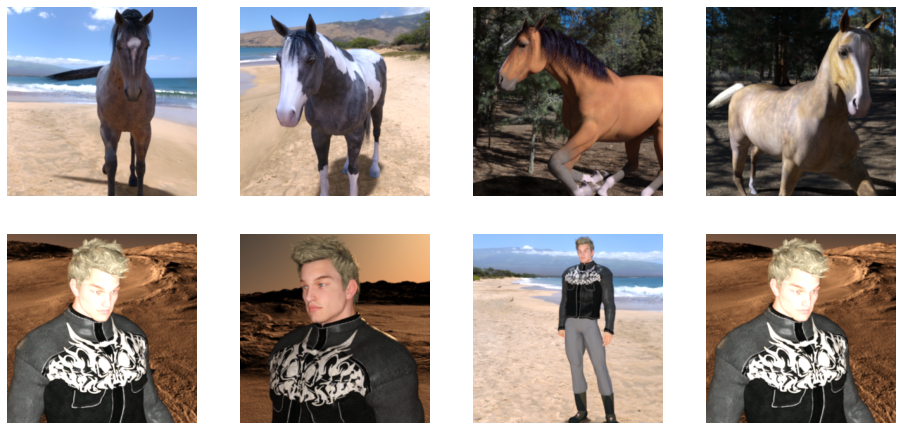

In [10]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

#we'll output images in a 4x4 configuration
nrows = 4
ncols = 4

# Index for iterating over images
pic_index = 0

# Set up matplotlib fig, and size it to fit 4x4 pics
fig = plt.gcf()
fig.set_size_inches(ncols * 4, nrows * 4)

pic_index += 4
next_horse_pix = [os.path.join(train_horse_dir, fname) 
                for fname in train_horse_names[pic_index-4:pic_index]]
next_human_pix = [os.path.join(train_human_dir, fname) 
                for fname in train_human_names[pic_index-4:pic_index]]

for i, img_path in enumerate(next_horse_pix+next_human_pix):
  # Set up subplot; subplot indices start at 1
  sp = plt.subplot(nrows, ncols, i + 1)
  sp.axis('Off') # Don't show axes (or gridlines)

  img = mpimg.imread(img_path)
  plt.imshow(img)

plt.show()

## Convolutional Model

As a model, a convolutional network will be used, which will work together with different pooling layers.

The "output shape" column shows how the size of your feature map evolves in each successive layer. Here you see how the convolution layers removes the outermost pixels of the image, and each pooling layer halves the dimensions.


# PRE PROCESSING

Next, the *generator* is used to resize all the images in a size of 150x150 and place their respective label (horse or human). An additional process will be to normalize the images so that the pixel values ​​are between [0,1]


In Keras, this can be done via the keras.preprocessing.image.ImageDataGenerator class using the rescale parameter. This ImageDataGenerator class allows you to instantiate generators of augmented image batches (and their labels) via .flow(data, labels) or .flow_from_directory(directory)

In [12]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(
      rescale=1./255,
      rotation_range=40,
      width_shift_range=0.2,
      height_shift_range=0.2,
      shear_range=0.2,
      zoom_range=0.2,
      horizontal_flip=True,
      fill_mode='nearest')

validation_datagen = ImageDataGenerator(rescale=1/255)

# Flow training images in batches of 128 using train_datagen generator
train_generator = train_datagen.flow_from_directory(
        './horse-or-human/',  
        target_size=(150, 150),  
        batch_size=20,
        # Since you use binary_crossentropy loss,need binary labels
        class_mode='binary')

validation_generator = validation_datagen.flow_from_directory(
        './validation-horse-or-human/', 
        target_size=(150, 150),  
        batch_size=20,
        class_mode='binary')

Found 1027 images belonging to 2 classes.
Found 256 images belonging to 2 classes.


## OPTIMIZER

In order to find the best learning rate for the model, a comparison is made between different loss values with different learning rates, looking for the one that provides the least value.

In [13]:
from tensorflow.keras.optimizers import RMSprop

lr_schedule = tf.keras.callbacks.LearningRateScheduler(
    lambda epoch: 1e-8 * 10**(epoch / 20))
optimizer = RMSprop(learning_rate=1e-8)

model.compile(loss='binary_crossentropy',
              optimizer=optimizer,
              metrics=["accuracy"])

history = model.fit(
      train_generator,
      steps_per_epoch=8,  
      epochs=120,
      verbose=1,
      validation_data = validation_generator,
      validation_steps=8,
      callbacks=[lr_schedule])


Epoch 1/120
8/8 [==============================] - 11s 985ms/step - loss: 0.7662 - accuracy: 0.5312 - val_loss: 0.7823 - val_accuracy: 0.5063 - lr: 1.0000e-08
Epoch 2/120
8/8 [==============================] - 7s 842ms/step - loss: 0.7633 - accuracy: 0.5500 - val_loss: 0.7665 - val_accuracy: 0.5000 - lr: 1.1220e-08
Epoch 3/120
8/8 [==============================] - 6s 832ms/step - loss: 0.7998 - accuracy: 0.4688 - val_loss: 0.7826 - val_accuracy: 0.4688 - lr: 1.2589e-08
Epoch 4/120
8/8 [==============================] - 7s 848ms/step - loss: 0.8039 - accuracy: 0.4688 - val_loss: 0.7547 - val_accuracy: 0.5250 - lr: 1.4125e-08
Epoch 5/120
8/8 [==============================] - 7s 842ms/step - loss: 0.7913 - accuracy: 0.4750 - val_loss: 0.7737 - val_accuracy: 0.4812 - lr: 1.5849e-08
Epoch 6/120
8/8 [==============================] - 7s 848ms/step - loss: 0.7446 - accuracy: 0.5250 - val_loss: 0.7651 - val_accuracy: 0.5000 - lr: 1.7783e-08
Epoch 7/120
8/8 [==============================] - 

Epoch 53/120
8/8 [==============================] - 7s 837ms/step - loss: 0.1771 - accuracy: 0.9750 - val_loss: 0.1122 - val_accuracy: 0.9750 - lr: 3.9811e-06
Epoch 54/120
8/8 [==============================] - 6s 833ms/step - loss: 0.1647 - accuracy: 0.9438 - val_loss: 0.1054 - val_accuracy: 0.9875 - lr: 4.4668e-06
Epoch 55/120
8/8 [==============================] - 7s 833ms/step - loss: 0.1541 - accuracy: 0.9625 - val_loss: 0.0846 - val_accuracy: 0.9875 - lr: 5.0119e-06
Epoch 56/120
8/8 [==============================] - 7s 833ms/step - loss: 0.1306 - accuracy: 0.9688 - val_loss: 0.0760 - val_accuracy: 0.9937 - lr: 5.6234e-06
Epoch 57/120
8/8 [==============================] - 7s 856ms/step - loss: 0.1358 - accuracy: 0.9750 - val_loss: 0.0575 - val_accuracy: 0.9937 - lr: 6.3096e-06
Epoch 58/120
8/8 [==============================] - 6s 813ms/step - loss: 0.0815 - accuracy: 0.9932 - val_loss: 0.0689 - val_accuracy: 0.9688 - lr: 7.0795e-06
Epoch 59/120
8/8 [============================

(1e-09, 0.1, 0.0, 2.0)

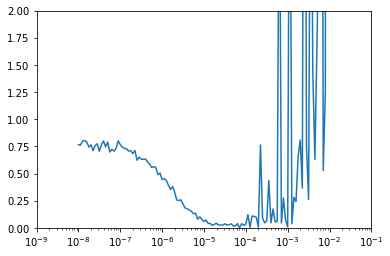

In [14]:
plt.semilogx(history.history["lr"], history.history["loss"])
plt.axis([1e-9, 1e-1, 0, 2])

### MODEL

In [15]:
from tensorflow.keras.optimizers import RMSprop

model.compile(loss='binary_crossentropy',
              optimizer=RMSprop(learning_rate=1e-5),
              metrics=['accuracy'])

history = model.fit(
      train_generator,
      steps_per_epoch=8,  
      epochs=120,
      verbose=1,
      validation_data = validation_generator,
      validation_steps=8,
      callbacks=[lr_schedule])

Epoch 1/120
8/8 [==============================] - 10s 949ms/step - loss: 11.5688 - accuracy: 0.9000 - val_loss: 3.3492 - val_accuracy: 0.9563 - lr: 1.0000e-08
Epoch 2/120
8/8 [==============================] - 7s 865ms/step - loss: 11.2921 - accuracy: 0.8875 - val_loss: 5.7249 - val_accuracy: 0.9250 - lr: 1.1220e-08
Epoch 3/120
8/8 [==============================] - 6s 805ms/step - loss: 5.6143 - accuracy: 0.9438 - val_loss: 7.0242 - val_accuracy: 0.9187 - lr: 1.2589e-08
Epoch 4/120
8/8 [==============================] - 6s 797ms/step - loss: 5.6372 - accuracy: 0.9375 - val_loss: 3.1803 - val_accuracy: 0.9563 - lr: 1.4125e-08
Epoch 5/120
8/8 [==============================] - 6s 802ms/step - loss: 5.4267 - accuracy: 0.9438 - val_loss: 5.3317 - val_accuracy: 0.9312 - lr: 1.5849e-08
Epoch 6/120
8/8 [==============================] - 6s 798ms/step - loss: 7.2657 - accuracy: 0.9187 - val_loss: 4.7495 - val_accuracy: 0.9250 - lr: 1.7783e-08
Epoch 7/120
8/8 [==============================] 

Epoch 53/120
8/8 [==============================] - 7s 920ms/step - loss: 5.5757 - accuracy: 0.9500 - val_loss: 3.5617 - val_accuracy: 0.9500 - lr: 3.9811e-06
Epoch 54/120
8/8 [==============================] - 8s 963ms/step - loss: 5.1719 - accuracy: 0.9438 - val_loss: 3.3139 - val_accuracy: 0.9563 - lr: 4.4668e-06
Epoch 55/120
8/8 [==============================] - 8s 979ms/step - loss: 7.8478 - accuracy: 0.9187 - val_loss: 4.1500 - val_accuracy: 0.9438 - lr: 5.0119e-06
Epoch 56/120
8/8 [==============================] - 8s 1s/step - loss: 8.2812 - accuracy: 0.9000 - val_loss: 5.5833 - val_accuracy: 0.9250 - lr: 5.6234e-06
Epoch 57/120
8/8 [==============================] - 8s 999ms/step - loss: 11.7304 - accuracy: 0.8750 - val_loss: 3.6733 - val_accuracy: 0.9438 - lr: 6.3096e-06
Epoch 58/120
8/8 [==============================] - 8s 1s/step - loss: 11.8355 - accuracy: 0.9250 - val_loss: 5.1134 - val_accuracy: 0.9375 - lr: 7.0795e-06
Epoch 59/120
8/8 [==============================] 

<Figure size 432x288 with 0 Axes>

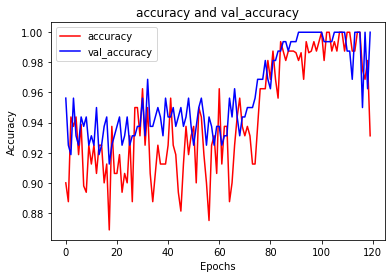

<Figure size 432x288 with 0 Axes>

In [16]:
import matplotlib.image  as mpimg
import matplotlib.pyplot as plt

#-----------------------------------------------------------
# Retrieve a list of list results on training and test data
# sets for each training epoch
#-----------------------------------------------------------
accuracy=history.history['accuracy']
val_accuracy=history.history['val_accuracy']


epochs=range(len(val_accuracy)) # Get number of epochs

#------------------------------------------------
# Plot MAE and Loss
#------------------------------------------------
plt.plot(epochs, accuracy, 'r')
plt.plot(epochs, val_accuracy, 'b')

plt.title('accuracy and val_accuracy')
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend(["accuracy", "val_accuracy"])

plt.figure()


Below you can see how the characteristics of each image vary

1/1 [==============================] - 1s 1s/step


<ipython-input-17-ff1447792917>:45: RuntimeWarning: invalid value encountered in true_divide
  x /= x.std()
<ipython-input-17-ff1447792917>:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(scale * n_features, scale))


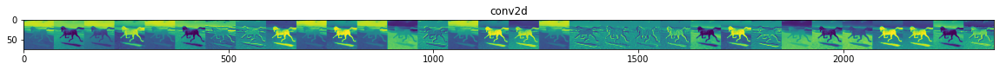

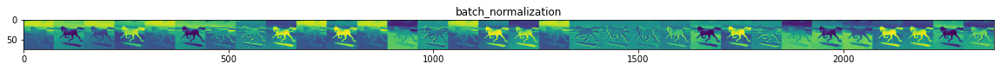

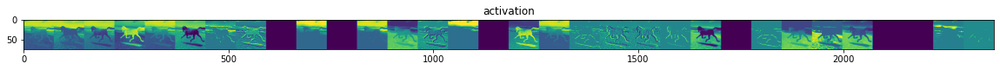

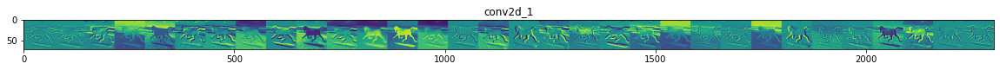

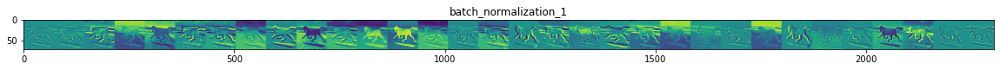

...

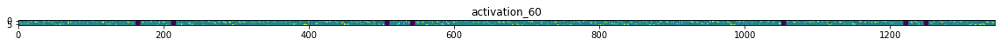

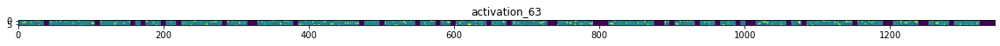

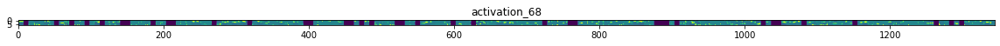

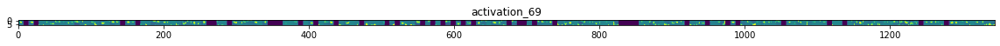

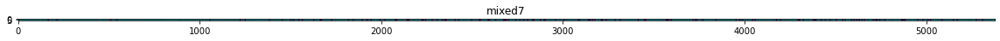

In [17]:
import numpy as np
import random
from tensorflow.keras.preprocessing.image import img_to_array, load_img

# Define a new Model that will take an image as input, and will output
# intermediate representations for all layers in the previous model after
# the first.
successive_outputs = [layer.output for layer in model.layers[1:]]
visualization_model = tf.keras.models.Model(inputs = model.input, outputs = successive_outputs)

# Prepare a random input image from the training set.
horse_img_files = [os.path.join(train_horse_dir, f) for f in train_horse_names]
human_img_files = [os.path.join(train_human_dir, f) for f in train_human_names]
img_path = random.choice(horse_img_files + human_img_files)

img = load_img(img_path, target_size=(150, 150))  # this is a PIL image
x = img_to_array(img)  # Numpy array with shape (300, 300, 3)
x = x.reshape((1,) + x.shape)  # Numpy array with shape (1, 300, 300, 3)

# Scale by 1/255
x /= 255

# Run the image through the network, thus obtaining all
# intermediate representations for this image.
successive_feature_maps = visualization_model.predict(x)

# These are the names of the layers, so you can have them as part of the plot
layer_names = [layer.name for layer in model.layers[1:]]

# Display the representations
for layer_name, feature_map in zip(layer_names, successive_feature_maps):
  if len(feature_map.shape) == 4:

    # Just do this for the conv / maxpool layers, not the fully-connected layers
    n_features = feature_map.shape[-1]  # number of features in feature map

    # The feature map has shape (1, size, size, n_features)
    size = feature_map.shape[1]
    
    # Tile the images in this matrix
    display_grid = np.zeros((size, size * n_features))
    for i in range(n_features):
      x = feature_map[0, :, :, i]
      x -= x.mean()
      x /= x.std()
      x *= 64
      x += 128
      x = np.clip(x, 0, 255).astype('uint8')
    
      # Tile each filter into this big horizontal grid
      display_grid[:, i * size : (i + 1) * size] = x
    
    # Display the grid
    scale = 20. / n_features
    plt.figure(figsize=(scale * n_features, scale))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

In order to evaluate the model, the image below is passed through the model and as can be seen, it was correctly classified.

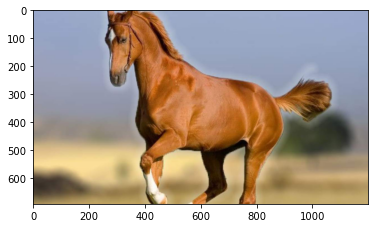

In [18]:
path = 'da.jpg' 
img = mpimg.imread(path)
plt.imshow(img)

In [19]:
import numpy as np
#from google.colab import files
from keras.preprocessing import image

# predicting images
path = 'da.jpg' 
img = tf.keras.utils.load_img(path, target_size=(150, 150))
x = tf.keras.utils.img_to_array(img)
x /= 255
x = np.expand_dims(x, axis=0)

images = np.vstack([x])
classes = model.predict(images, batch_size=10)
print(classes[0])

if classes[0]>0.5:
    print(path + " is a human")
else:
    print(path + " is a horse")

1/1 [==============================] - 1s 758ms/step
[0.]
da.jpg is a horse


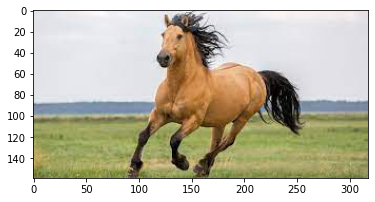

In [21]:
path = 'horse.jpeg'
img = mpimg.imread(path)
plt.imshow(img)

In [22]:
import numpy as np
#from google.colab import files
from keras.preprocessing import image

# predicting images
path = 'horse.jpeg' 
img = tf.keras.utils.load_img(path, target_size=(150, 150))
x = tf.keras.utils.img_to_array(img)
x /= 255
x = np.expand_dims(x, axis=0)

images = np.vstack([x])
classes = model.predict(images, batch_size=10)
print(classes[0])

if classes[0]>0.5:
    print(path + " is a human")
else:
    print(path + " is a horse")

1/1 [==============================] - 0s 58ms/step
[0.]
horse.jpeg is a horse
